# Práctica 5.3 Tratamiento Digital de Imagen

Autor:Javier Blázquez Ramírez

# Construcción del Entorno

Lo primero tras descargar los paquetes necesarios para la realización, los iremos cargando según necesitemos. Los primeros los cargaremos ahora.

In [1]:
using Images, TestImages, ImageIO, ImageMagick, ImageContrastAdjustment

Recuerda ajustar el directorio de trabajo para que existan las imagenes que van a ser usadas.

# Solución

## Modificación de imágenes

**1. Lea las imagenes "vista_ciudad.TIF", "coins.png" y "peppers.png". La 1º imagen se debe cargar en img1, la 2ª en img2 y la 3ª en img3.**

Cargaremos las imágenes descargadas, situadas en el mismo directorio que este archivo. Además, las representaremos para ver como son las imágenes.

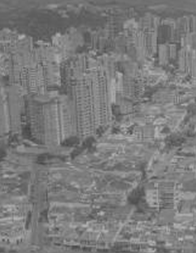

In [2]:
img1 = Images.load("vista_ciudad.TIF")

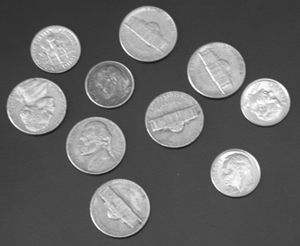

In [3]:
img2 = Images.load("coins.png")

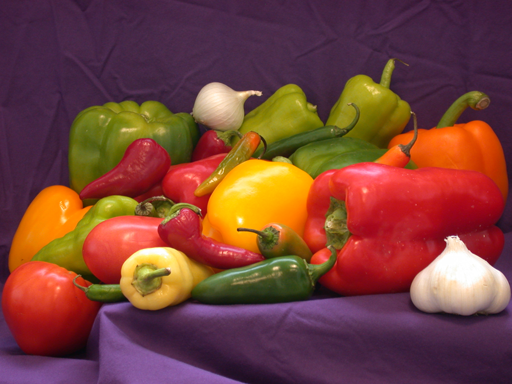

In [4]:
img3 = Images.load("peppers.png")

**2. Ecualizar linealmente las imágenes 1 y 2 en img1_1 y img2_1**

Para ecualizar linealmente las imágenes, nos ayudaremos de la primitiva _adjust_histogram_. Veamos como son las imágenes antes y después de la ecualización.

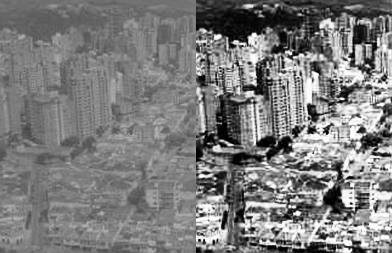

In [5]:
img1_s = adjust_histogram(img1, Equalization(nbins = 256, minval = 0,
maxval = 1));
mosaicview(img1, img1_s,nrow=1)

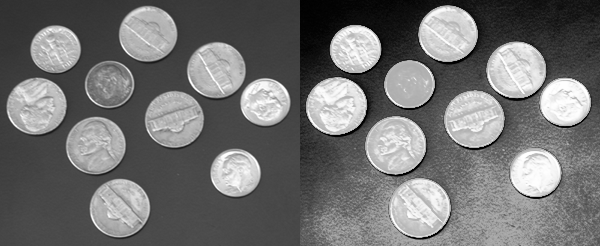

In [6]:
img2_s = adjust_histogram(img2, Equalization(nbins = 256, minval = 0,
maxval = 1))
mosaicview(img2, img2_s,nrow=1)

**3. Visualizar en dos figuras de 2 x 2 las imágenes y sus igualaciones:**

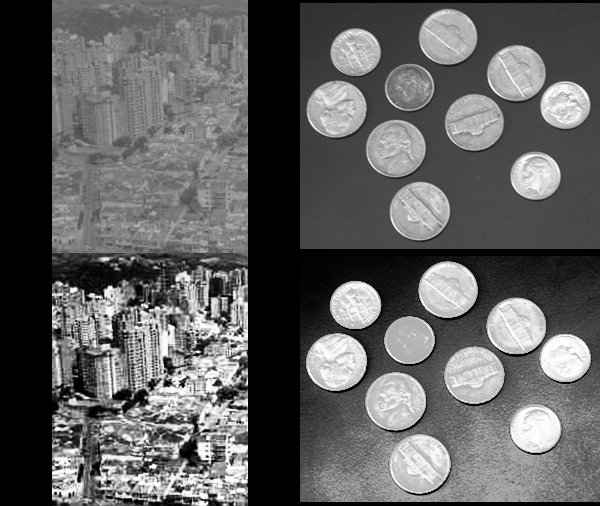

In [7]:
mosaicview(img1, img1_s, img2, img2_s; nrow = 2)

Vemos como las imágenes no son iguales tras ejecutar la ecualización lineal del histograma, vemos como a la hora de visualizar imágenes si que se nota esa ecualización. 

**4. Convertir img3 a escala de grises y visualizarla.**

Para convertir la _img3_ a escala de grises nos ayudaremos de la primitiva, proporcionada por el paquete _Images_. También, ecualizaremos la imagen en escala de grises y veremos las tres conjuntas.

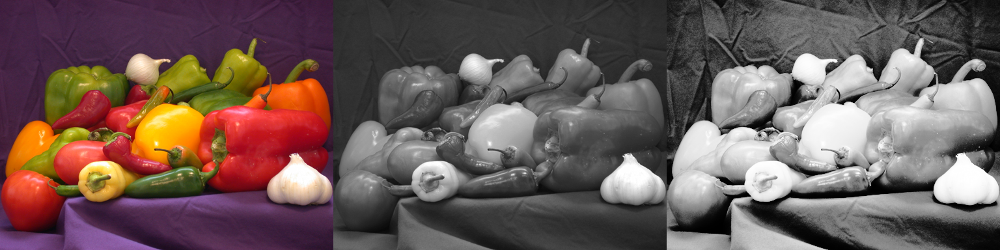

In [8]:
img3_g = Gray.(img3);# Aprendido en %1y2
img3_g_s = adjust_histogram(img3_g, Equalization(nbins = 256, minval = 0,
maxval = 1));
mosaicview(img3, img3_g, img3_g_s; nrow = 1)

**5. Obtenga los canales R, G y B de img3**

Para obtener los canales de color de la imagen 3, nos ayudaremos de las primitivas del mismo paquete anterior. Las cuales nos proporcionan los canales correspondientes.

In [9]:
img3_R = red.(img3);#Aprendido en P5.1y2
img3_G = green.(img3);
img3_B = blue.(img3);

**Visualice los canales R, G y B de img3_g lado a lado en ese orden:**

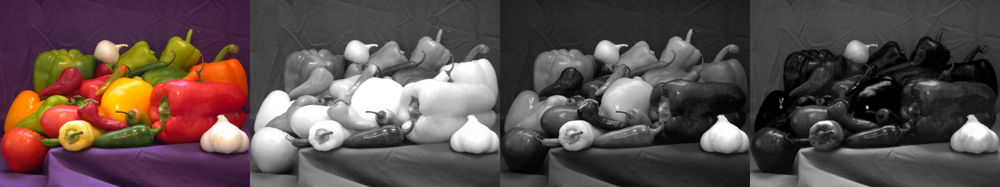

In [10]:
mosaicview(img3,img3_R,img3_G,img3_B; nrow=1)

Otra manera de acceder los canales, con desestructuración, usando la función _channelview_, la cual nos devuelve la imagen en canales en un mismo Array.

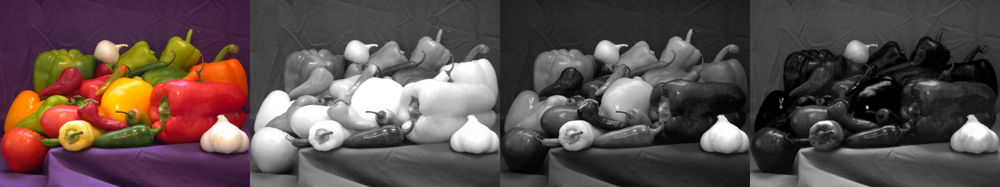

In [11]:
img3_CHV = channelview(img3)#Desestructurar el pixel en tres dimensiones
img3R = img3_CHV[1,:,:];
img3G = img3_CHV[2,:,:];
img3B = img3_CHV[3,:,:];
mosaicview(img3,img3R,img3G,img3B; nrow=1)

Ahora combinaremos, otra vez los tres canales obtenidos antes, para ver como la imagen no se ve alterada en este proceso de obtener los canales. Para combinarlos, usaremos la función _colorview_.

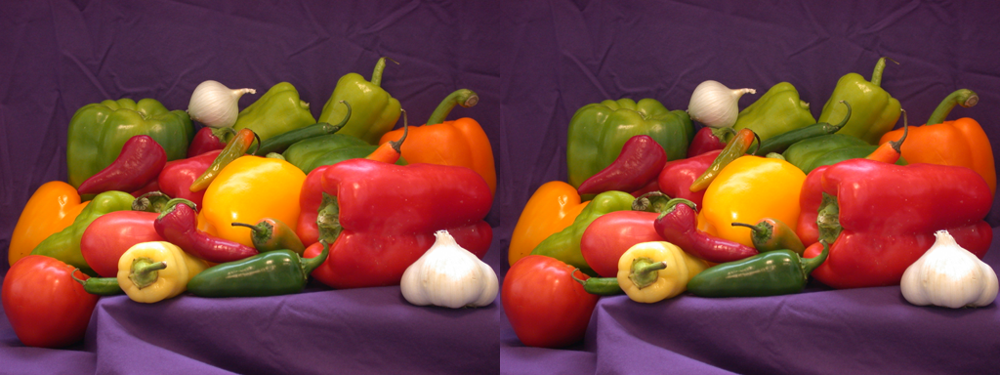

In [12]:
mosaicview(img3, colorview(RGB, img3R, img3G, img3B); nrow=1)

**6. Cree una imagen img3_nR como img3 en la que el canal R ha sido substituido por el "complementario" del canal R de img3 (recuerde la codificación de colores y tonos de grises en Julia) y visualize ambas imágenes, 
original y modificado lado a lado:**

Lo primero será separar la imagen original en los diferentes canales, ese paso lo tenemos completado en el ejercicio anterior. Usaremos el canal rojo para calcular su complementario. El canal original sumado al canal complementario suma 1. Con esta relación se calcula el canal complementario como:

$$
canalComplementario = 1 - canalOrignial
$$

Tras esto, volveremos a juntar los canales de la misma manera que lo hicimos anteriormente, y veremos como, tras modificar un canal, la imagen sí se ve alterada.

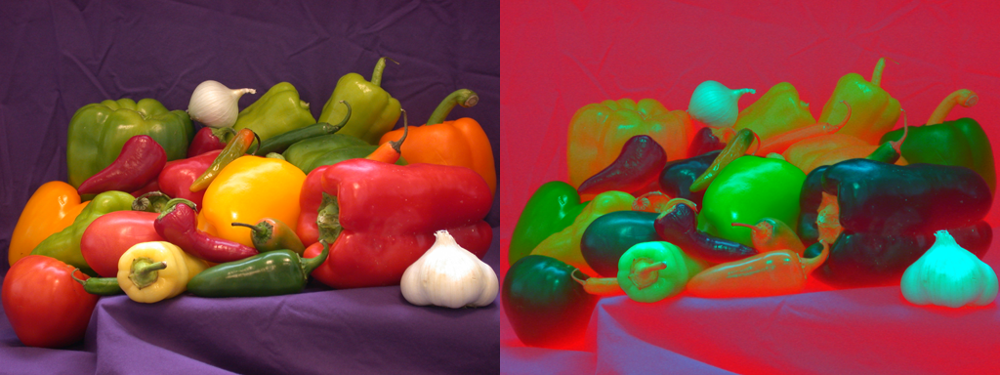

In [13]:
img3_Rn = 1 .- img3R # Canal rojo complementario 

# Crear la nueva imagen modificada
img3_nR = colorview(RGB, img3_Rn, img3G, img3B)
mosaicview(img3, img3_nR, nrow=1)

## Histogramas

In [14]:
using Distributions#Invoca a las primitivas de estadística para generar distribuciones.
using Statistics, StatsBase
using Plots

**7. Genere una muestra de tamaño 10^5 de una Gaussiana de media 1 y varianza 2 y represente el histograma**

Generaremos una Gaussiana de media 1 y varianza 2. La samplearemos para obtener sus valores, y después, calcularemos su media, su varianza y veremos la forma del histograma.

0.991392518305791
2.0064138386024473


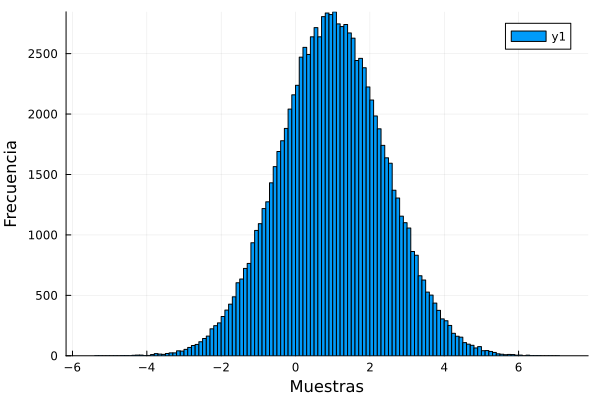

In [15]:
gaussian = Normal(1,sqrt(2)) # std = sqrt(2)^2 -> varianza igual a 2
sample = rand(gaussian,10^5);
println(mean(sample))
println(var(sample))
hist = histogram(sample)#Using Histogram from StatsBase
plot!(hist,xlabel="Muestras", ylabel="Frecuencia")

## Umbralizado

In [16]:
using  ImageBinarization

**8. Umbraliza la img2. Para ello encuentra un umbral adecuado para la umbralización con el algoritmo de Otsu.**

La umbralización se trata de encontrar un valor, al partir del cual, se puede determinar si un pixel pertenece a un objeto u a otro a la hora de binarizar y segmentar una imagen.

Encontraremos primero el valor idóne calculado por el algoritmo de Otsu.

In [17]:
t = find_threshold(img2, Otsu(); nbins = 256)
println("El umbral adecuado para binarizar con el algoritmo de Otsu es: ", t)

El umbral adecuado para binarizar con el algoritmo de Otsu es: 0.49178922


**Lleva a cabo la binarización. Termina ilustrando la imagen original y la umbralizada.**

Teniendo calculado el umbral, podemos binarizar la imagen, de una manera "artesanal", siendo 1 si el valor del pixel es superior al umbral, y respectivamente, siendo 0 si es inferior.

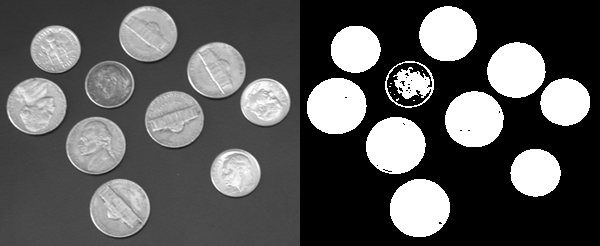

In [18]:
img2_BW_Otsu = img2 .> t
mosaicview(img2, img2_BW_Otsu; nrow=1)

**Binarize con el algoritmo de umbralizado adaptativo. Visualiza junto al resultado anterior y comenta el resultado.** 

Ahora el algoritmo que usaremos es diferente al anterior, tanto como el umbral como la binarización son calculados también de manera diferente, ayudándonos de funciones primitivas.

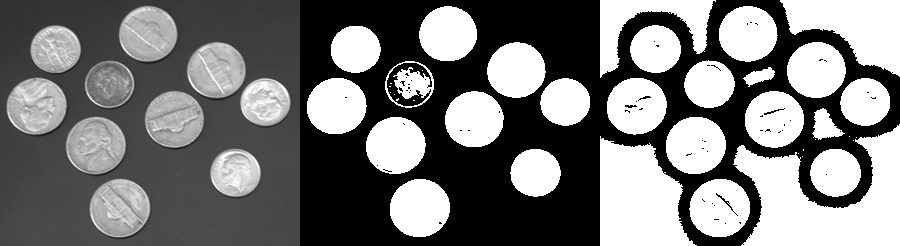

In [19]:
f = AdaptiveThreshold(img2)
img2_BW_Adaptive = binarize(img2, f)

mosaicview(img2, img2_BW_Otsu, img2_BW_Adaptive; nrow=1)

Tenemos como la binarización de la imagen con diferentes algoritmos hace que las imágenes binarias obtenidas sean diferentes entre sí. En la última imagen, con umbral adaptativo, vemos como las zonas del fondo de la imagen las separa en dos, alrededor de las monedas con valores de 0, siendo visualmente negro, y el resto del fondo con valor 1. A diferencia de la primera umbralización, que reconoce todo el fondo como un solo objeto.

## Visualización del ruido

In [20]:
using Noise

In [21]:
img4 = img2;

**Genera tres nuevas imágenes con ruido gaussiano aditivo, multiplicativo y "salt & pepper" con potencia media de ruido 0.02 y visualízalas en una sola figura.**

Ahora, crearemos las formas de ruido especificadas.

Definiremos la potencia del ruido como la varianza. La varianza podemos definirla como el cuadrad de la desviación típica, que es el parámetro que le pasaremos a la primitiva.

Por tanto, si queremos una potencia de ruido de 0.02, la varianza es igual a 0.02, y la desviación típica es igual a la raíz cuadrada de 0,2.

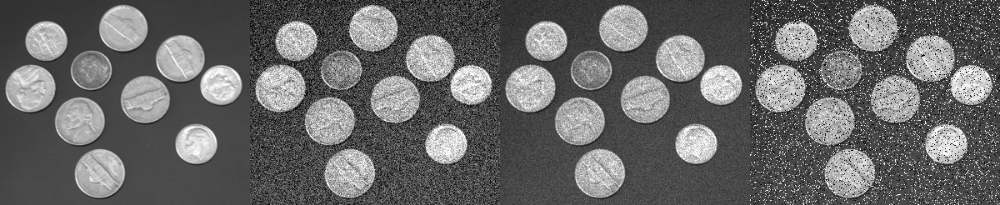

In [22]:
power = 0.02
desv_tip = sqrt(power)
img4_ga = add_gauss(img4, desv_tip);
img4_gm = mult_gauss(img4, desv_tip);
img4_sp = salt_pepper(img4, desv_tip);
mosaicview(img4,img4_ga, img4_gm, img4_sp; nrow=1)

**Calcule y represente sus tres histogramas en una figura 1x3**

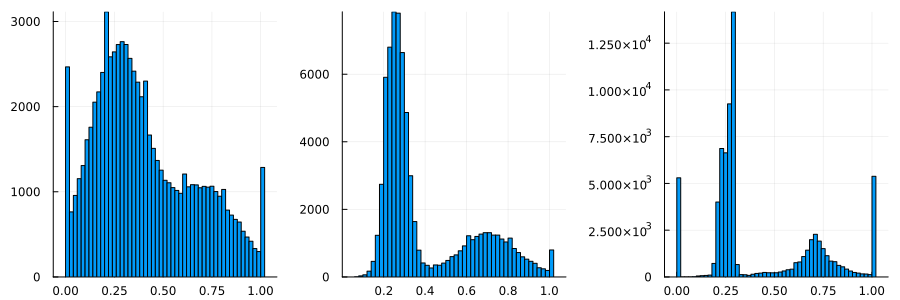

In [23]:
hist_img4_ga = histogram(vec(Float64.(img4_ga)));
hist_img4_gm = histogram(vec(Float64.(img4_gm)));
hist_img4_sp = histogram(vec(Float64.(img4_sp)));
plot(
    hist_img4_ga,
    hist_img4_gm,
    hist_img4_sp,
    layout=(1, 3),
    legend=false,
    size=(900, 300)
)

Así nos quedan los diferentes histogramas de las imágenes afectas por diferentes tipos de ruidos. Vemos como afectan al histograma de la imagen de manera diferente según el tipo de ruido que utilicemos.

## Filtrado Lineal

Filtra img4_ga con una máscara de suavizado 5x5 con la estrategia "zero padding" y "mirror padding" y 
guarda el resultado en img4_ga_fzer e img_ga_fsym. 

Lee como referencia: 
https://juliaimages.org/ImageFiltering.jl/stable/function_reference/#ImageFiltering.MapWindow.mapwindow

Usa el ejemplo (que es para un filtro de mediana) de:
https://juliaimages.org/ImageFiltering.jl/stable/demos/filters/median_filter/#Custom-median-filters

In [24]:
using ImageFiltering #Debería estar en JuliaImages

Crearemos un filtro de suavizado de 5x5, este debe ser una matriz 5x5, que sumen uno todas sus celdas.

In [25]:
filtro_suavizado = ones(Float64, 5, 5) / 25.0;
img4_ga_fzer = imfilter(img4_ga, filtro_suavizado,Fill(0));
img4_ga_fsym = imfilter(img4_ga, filtro_suavizado, "symmetric");

**Representa en una figura 1x3 las variables img4, img4_ga  e img4_ga_fzer.**

Veamos las imágenes pedidas.

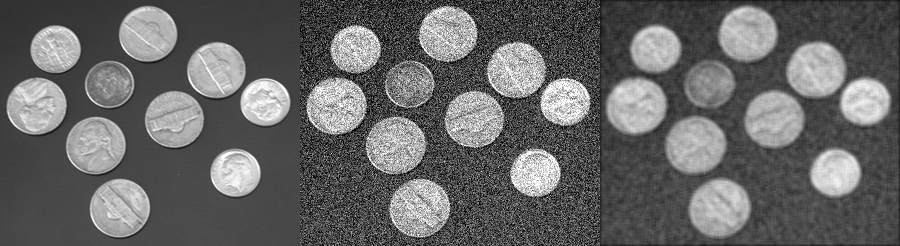

In [26]:
mosaicview(img4, img4_ga,img4_ga_fzer , nrow=1)

**Representa en una figura de 2x2 img4_ga_fzer e img4_ga_fsym, y sus histogramas.**

Calculemos primero sus histogramas y después veamos las imágenes.

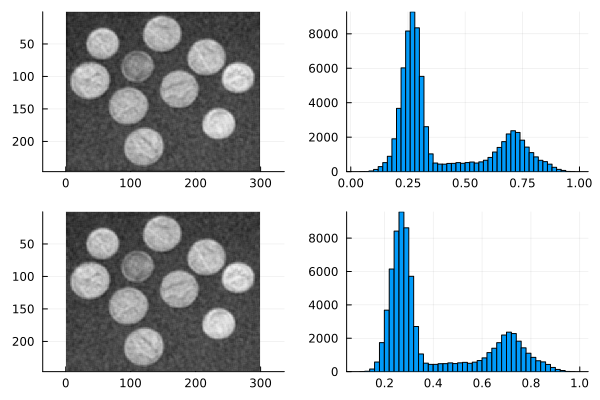

In [27]:
hist_img4_ga_fzer = histogram(vec(Float64.(img4_ga_fzer)));
hist_img4_ga_fsym = histogram(vec(Float64.(img4_ga_fsym)));

plot(
    plot(img4_ga_fzer),
    hist_img4_ga_fzer,
    plot(img4_ga_fsym),
    hist_img4_ga_fsym,
    layout=(2,2),
    legend=false
)

**Repite los pasos anteriores con img4_sp, img4_sp_fzer  e img_sp_fsym.**

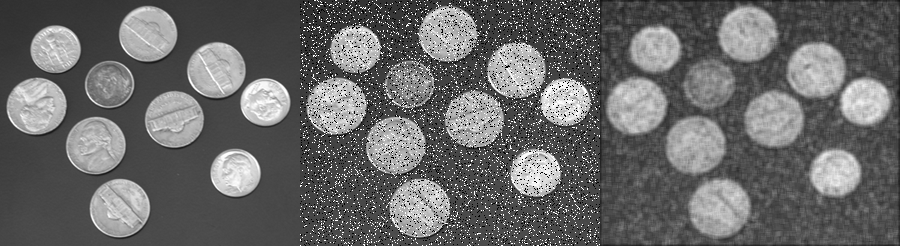

In [28]:
img4_sp_fzer = imfilter(img4_sp, filtro_suavizado,Fill(0));
img4_sp_fsym = imfilter(img4_sp, filtro_suavizado, "symmetric");
mosaicview(img4, img4_sp,img4_sp_fzer , nrow=1)

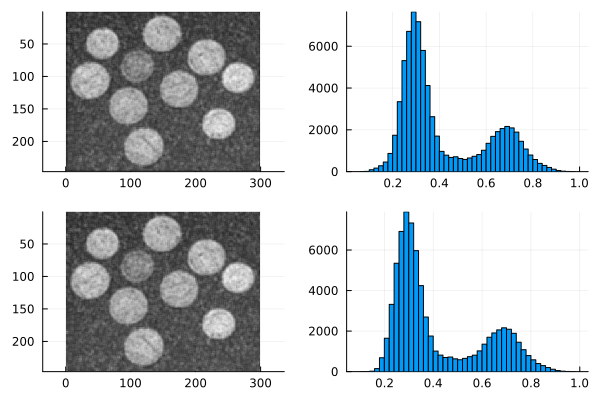

In [29]:
hist_img4_sp_fzer = histogram(vec(Float64.(img4_sp_fzer)));
hist_img4_sp_fsym = histogram(vec(Float64.(img4_sp_fsym)));

plot(
    plot(img4_sp_fzer),
    hist_img4_sp_fzer,
    plot(img4_sp_fsym),
    hist_img4_sp_fsym,
    layout=(2,2),
    legend=false
)

**Repite los pasos anteriores con img4_gm, img4_gm_fzer  e img_gm_fsym.**

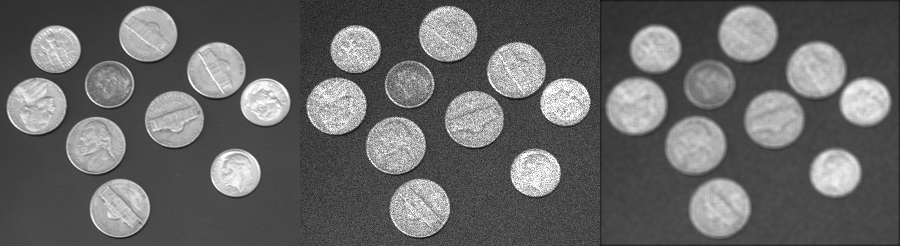

In [30]:
img4_gm_fzer = imfilter(img4_gm, filtro_suavizado,Fill(0));
img4_gm_fsym = imfilter(img4_gm, filtro_suavizado, "symmetric");
mosaicview(img4, img4_gm,img4_gm_fzer , nrow=1)

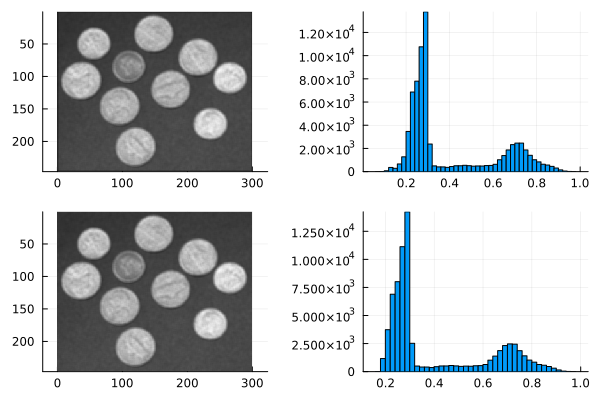

In [31]:
hist_img4_gm_fzer = histogram(vec(Float64.(img4_gm_fzer)));
hist_img4_gm_fsym = histogram(vec(Float64.(img4_gm_fsym)));

plot(
    plot(img4_gm_fzer),
    hist_img4_gm_fzer,
    plot(img4_gm_fsym),
    hist_img4_gm_fsym,
    layout=(2,2),
    legend=false
)

## Filtrado de mediana

Filtra img4_ga con un filtro de mediana 5x5 con la estrategia "zero padding" y "mirror padding" y 
guarda el resultado en img4_fmedzer y img4_fmedsym.

Usa el ejemplo de:
https://juliaimages.org/ImageFiltering.jl/stable/demos/filters/median_filter/#Custom-median-filters

In [32]:
using ImageFiltering

Para aplicar un filtro de mediana con "zero padding", únicamente debemos llamar a la función _mapwindow_, sin pasarle ningún parámetro especial.

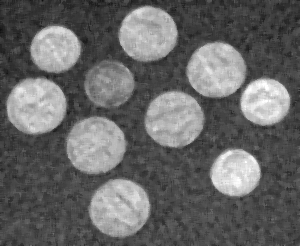

In [37]:
img4_fmedzer = mapwindow(median, img4_ga, (5,5))

Sin embargo, si queremos aplicar la técnica de "mirror padding" , tenemos que especificarle a esa función que queremos que en los bordes este la señal reflejada simétricamente. Lo conseguiremos con el parámetro _border_, el cual le asignaremos el valor de _"symmetric"_.

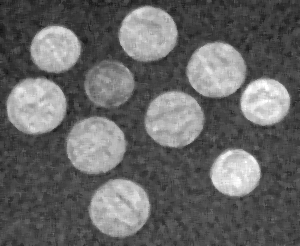

In [38]:
img4_fmedsym = mapwindow(median, img4_ga, (5,5),border="symmetric")

**Representa en una figura 1x3 img4, img4_ga y img4_fmedzer.**

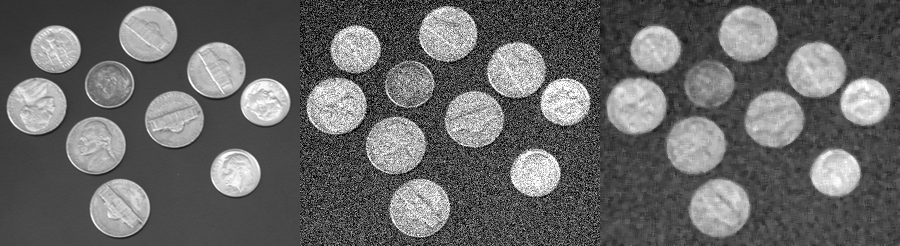

In [39]:
mosaicview(img4, img4_ga, img4_fmedzer,nrow=1)

**Representa en una figura 2x2 img4_fmedzer, img4_fmedsym y sus histogramas.**

Ahora veremos como son los histogramas correspondientes.

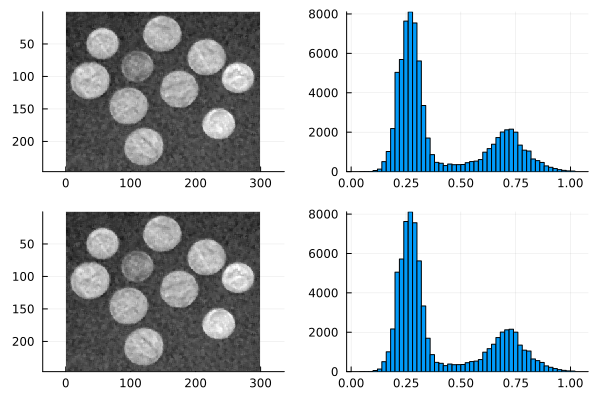

In [40]:
hist_img4_fmedzer = histogram(vec(Float64.(img4_fmedzer)));
hist_img4_fmedsym = histogram(vec(Float64.(img4_fmedsym)));

plot(
    plot(img4_fmedzer),
    hist_img4_fmedzer,
    plot(img4_fmedsym),
    hist_img4_fmedsym,
    layout=(2,2),
    legend=false
)

## Resultados de Aprendizaje

En esta práctica se ha tratado de aprender como afectan las modificaciones que podemos realizar sobre las imágenes, y como podemos ayudarnos para la detección de objetos.

Vemos como hay que tener especial cuidado a la hora de trabajar con los diferentes canales de la imagen, siendo muy sensible la imagen final a cambios importantes en la visualización.

También, se ha trabajado con umbralización. Este es un primer paso a la detección de objetos. Convirtiendo la imagen en escala de grises, a una imagen binaria, en la que se reconocen diferentes objetos. A su vez, hay que tener en cuenta el algoritmo con el que se trabaja a la hora de calcular ese umbral, pues no todos generan las mismas imágenes binarias. 

Observamos también técnicas de filtrado, tanto lineal como otros como los de mediana. Estos nos proporcionan diferentes imágenes, que aunque parezcan iguales no lo son. Lo podemos apreciar en los histogramas, que aunque tengan la misma forma, están ligeramente desplazadas. 

A la hora de trabajar con imágenes, debemos tener en cuenta las técnicas que utilizamos. Si no seguimos esto, podemos tener resultados no deseados.